# Run cellpose on a single file

In [1]:
# Let's actually be precise about Ada's comments and origin of the images

# czi_file_path = '/home/membrane/FISH1_BDNF488_1_cLTP_1_CA.czi'
# czi_file_path = '/home/membrane/FISH1_BDNF488_1_cLTP_3_CA.czi'

# czi_file_path = '/home/membrane/FISH1_BDNF488_7_cLTP_romi_4_CA.czi'
# https://hub.membrane.computer/viewer/a.magalska@nencki.edu.pl/FISH1_BDNF488_7_cLTP_romi_4_CA.czi
# Różowe jądro pośrodku od góry spoza segmentacji wystaje fragment jądra, a na dole segmentacja obejmuje zbyt duży obszar. 

# czi_file_path = '/home/membrane/FISH1_BDNF488_1_cLTP_9_CA.czi'
# https://hub.membrane.computer/viewer/a.magalska@nencki.edu.pl/FISH1_BDNF488_1_cLTP_9_CA.czi
# szczególnie to widać na jądrze górnym żółtym i różowym i dolnym fioletowym (po lewej na dole). 
# Dużo lepiej wyszło niebieskie (pod żółtym) pozostałe komórki mają tu i ówdzie zbyt dużo. 

czi_file_path = '/home/ubuntu/Projects/data/uploads/m.zdanowicz@gmail.com/FISH1_BDNF488_1_cLTP_1_CA_origina_Dec2.czi'
# https://hub.membrane.computer/viewer/a.magalska@nencki.edu.pl/FISH1_BDNF488_6_DMSO_7_CA.czi
# tu jest jakoś w ogóle dziwnie, już 2D wygląda lepiej. 

# czi_file_path = '/home/membrane/FISH1_BDNF488_1_cLTP_2_CA.czi'
# https://hub.membrane.computer/viewer/a.magalska@nencki.edu.pl/FISH1_BDNF488_1_cLTP_2_CA.czi 
# tu część jąder ma za dużo po kilka pixeli, a druga część ma za mało.

# czi_files = ['/home/membrane/FISH1_BDNF488_7_cLTP_romi_4_CA.czi',
#              '/home/membrane/FISH1_BDNF488_1_cLTP_9_CA.czi',
#              '/home/membrane/FISH1_BDNF488_6_DMSO_7_CA.czi',
#              '/home/membrane/FISH1_BDNF488_1_cLTP_2_CA.czi']
out_mask_filepath = "./"

In [2]:
# we assume we make use of only one channel (DAPI) from the input
nuclei_channel = -1
mask_volume_threshold_of_max = 0.05
diameter = 110

In [3]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 150

from urllib.parse import urlparse
import torch
from cellpose import utils

from pathlib import Path

# use_GPU = utils.use_gpu()
# print('GPU activated? %d'%use_GPU)

In [4]:
assert Path(czi_file_path).suffix == '.czi', czi_file_path

In [5]:
base_filename = Path(czi_file_path).stem
base_filename

'FISH1_BDNF488_1_cLTP_1_CA_origina_Dec2'

## save output to *_seg.npy

you will see the files save in the Files tab and you can download them from there

# Read the data

In [6]:
# TODO(gkk): we might want to save this 
# from cellpose import io

# io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)

In [7]:
import tifffile
tifffile.__version__

'2020.12.8'

In [8]:
from tifffile import imread

In [9]:
from aicsimageio import AICSImage

In [15]:
# swap axes so we have the (Z, channels, Y, X) shape
# TODO: make this automatic

data = AICSImage(czi_file_path).data.squeeze()
if len(data.shape) == 3:
    data = data[np.newaxis,...]

data = np.swapaxes(data, 0, 1)
data.shape

(63, 1, 1024, 1024)

In [16]:
z_start_idx, z_end_idx = 0, data.shape[0]
z_start_idx, z_end_idx

(0, 63)

In [17]:
imgs = data[z_start_idx:z_end_idx,nuclei_channel,:,:]

In [18]:
imgs.shape

(63, 1024, 1024)

# Reduce noise with histogram clipping

In [19]:
# sample = imgs[19]

In [20]:
# plt.imshow(sample)

In [21]:
# plt.hist(sample.flatten(), range=(1, sample.max()), bins=100, log=True)

## Right clipping

In [22]:
def right_clip(a, right_clip_low_p=95, right_clip_high_p=98):
    right_clip_low, right_clip_high = int(np.percentile(a, right_clip_low_p)), int(np.percentile(a, right_clip_high_p))
    to_clip_mask = a > np.percentile(a, right_clip_high_p)
    to_clip = a[to_clip_mask]
    clipping_values = np.random.randint(right_clip_low, right_clip_high+1, to_clip.shape)
    a_clipped = a.copy()
    a_clipped[to_clip_mask] = clipping_values
    assert a.shape == a_clipped.shape
    return a_clipped

In [23]:
# sample_clipped = right_clip(sample)

In [24]:
# plt.hist(sample_clipped.flatten(), range=(1, sample_clipped.max()), bins=100, log=True)

In [25]:
imgs_right_clipped = np.array([right_clip(imgs[i]) for i in range(imgs.shape[0])])

In [26]:
# sample = imgs_right_clipped[19]
# sample = sample/sample.max()
# plt.imshow(sample)

## Left clipping

In [27]:
# percentiles = np.percentile(imgs_right_clipped, q=70, axis=(1,2))
# percentiles

In [28]:
# imgs_denoised = imgs_right_clipped - percentiles[:, None, None]

In [29]:
# imgs_denoised[imgs_denoised < 0] = 0

In [30]:
def left_clip(data, q):
    assert len(data.shape) >= 2, "Too short"
    percentiles = np.percentile(data, q=q, axis=(-2,-1))
    percentiles = percentiles[...,np.newaxis, np.newaxis]
    data_denoised = data - percentiles
    data_denoised[data_denoised < 0] = 0
    return data_denoised

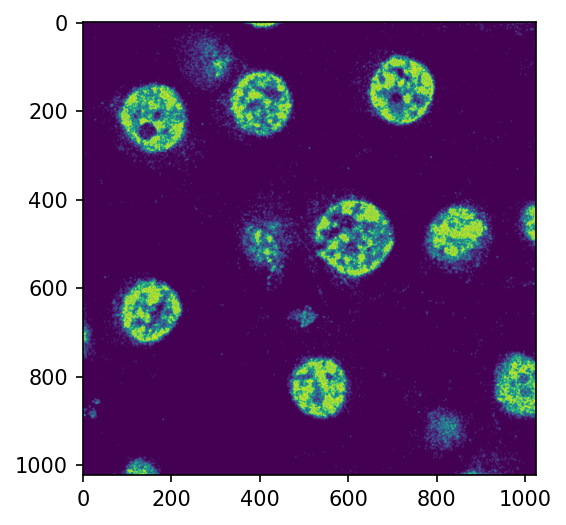

In [31]:
imgs_denoised = left_clip(imgs_right_clipped,75)
sample = imgs_denoised[19]
plt.imshow(sample)

In [32]:
from skimage import color, data, restoration
from scipy.signal import convolve2d as conv2

z = imgs_denoised.shape[0]
psf = np.ones((7, 7)) / 49
imgs_conved = np.array([conv2(imgs_denoised[i]/imgs_denoised.max(), psf, 'same') for i in range(z)])
# plt.imshow(imgs_conved[19])

In [33]:
imgs_conv_clipped = left_clip(imgs_conved, 82)
# deconvolved, _ = restoration.unsupervised_wiener(sample, psf)
# deconvolved

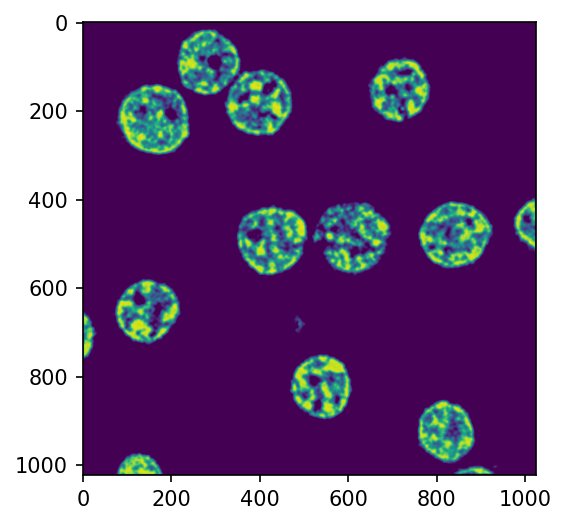

In [34]:
plt.imshow(imgs_conv_clipped[30])

In [35]:
# def image_process(name):
#     data = AICSImage(czi_file_path).data.squeeze()
#     if len(data.shape) == 3:
#         data = data[np.newaxis,...]
#     data = np.swapaxes(data, 0, 1)
#     imgs = data[z_start_idx:z_end_idx,nuclei_channel,:,:]
#     imgs_right_clipped = np.array([right_clip(imgs[i]) for i in range(imgs.shape[0])])
#     imgs_denoised = left_clip(imgs_right_clipped,70)
#     psf = np.ones((7, 7)) / 49
#     imgs_conved = np.array([conv2(imgs_denoised[i]/imgs_denoised.max(), psf, 'same') for i in range(z)])
#     imgs_conv_clipped = left_clip(imgs_conved, 80)
#     return imgs_denoised, imgs_conv_clipped

In [36]:
# data = {}
# for czi_file in czi_files:
#     imgs_denoised, imgs_conv_clipped = image_process(czi_file)
#     data[czi_file] = (imgs_denoised.copy(), imgs_conv_clipped.copy())

In [37]:
# def compute_and_show(data):
#     imgs_to_process = data
#     channels = len(imgs_to_process)*[[0,0]]
#     model = models.Cellpose(gpu=True, model_type='cyto')
#     # in this example I'm using a random matrix, put your own data here
#     # data = np.random.randn(120,512,512).astype(np.float32)
#     # data = imread('/home/gkk/ada_lsm_test_squeeze.tif')

#     # with 3D you have to set the diameter manually (no auto detect)
#     #imgs, diameter=110, #flow_threshddold=, 
#     #                                         cellprob_threshold=0.5, resample=True,
#     #                                          flow_threshold=0.2,
#     #                                         stitch_threshold=0.4,
#     #                                         channels=channels
#     masks, flows, styles, diams = model.eval(imgs_to_process, channels=channels,
#                                          diameter=110, 
#                                          do_3D=True, 
#                                          resample=True,
# #                                          cellprob_threshold=0.1,
# #                                          augment=True,
# #                                          flow_threshold=0.8,
#                                          anisotropy=3.0,
# #                                         boundary_threshold=0.5
# #                                          min_size=100.0,
#                                          batch_size=4)
#     print(f"How many masks: {len(np.unique(masks))}")
#     display_results(imgs_to_process, masks, flows[0])

In [38]:
# czi_file = czi_files[0]
# imgs_denoised, imgs_conv_clipped = data[czi_file]
# print("Denoised..")
# compute_and_show(imgs_denoised)
# print("Convoluted and clipped..")
# compute_and_show(imgs_conv_clipped)

In [39]:
# czi_file = czi_files[1]
# imgs_denoised, imgs_conv_clipped = data[czi_file]
# print(f"Denoised.. for {czi_file}")
# compute_and_show(imgs_denoised)
# print(f"Convoluted and clipped.. for {czi_file}")
# compute_and_show(imgs_conv_clipped)

In [40]:
# czi_file = czi_files[2]
# imgs_denoised, imgs_conv_clipped = data[czi_file]
# print(f"Denoised.. for {czi_file}")
# compute_and_show(imgs_denoised)
# print(f"Convoluted and clipped.. for {czi_file}")
# compute_and_show(imgs_conv_clipped)

In [41]:
# czi_file = czi_files[3]
# imgs_denoised, imgs_conv_clipped = data[czi_file]
# print(f"Denoised.. for {czi_file}")
# compute_and_show(imgs_denoised)
# print(f"Convoluted and clipped.. for {czi_file}")
# compute_and_show(imgs_conv_clipped)

## run cellpose in convoluted clipped version on CZI image

In [42]:
# imgs_to_process = imgs_denoised
imgs_to_process = imgs_conv_clipped

In [37]:
channels = len(imgs_to_process)*[[0,0]]

In [38]:
%%time
# test 3D stack
from cellpose import models

model = models.Cellpose(gpu=True, model_type='cyto')

# in this example I'm using a random matrix, put your own data here
# data = np.random.randn(120,512,512).astype(np.float32)
# data = imread('/home/gkk/ada_lsm_test_squeeze.tif')

# with 3D you have to set the diameter manually (no auto detect)
#imgs, diameter=110, #flow_threshddold=, 
#                                         cellprob_threshold=0.5, resample=True,
#                                          flow_threshold=0.2,
#                                         stitch_threshold=0.4,
#                                         channels=channels
masks, flows, styles, diams = model.eval(imgs_to_process, channels=channels,
                                         diameter=110, 
                                         do_3D=True, 
                                         resample=True,
#                                          cellprob_threshold=0.1,
#                                          augment=True,
#                                          flow_threshold=0.8,
                                         anisotropy=3.0,
#                                         boundary_threshold=0.5
#                                          min_size=100.0,
                                         batch_size=4)

TORCH CUDA version not installed/working.
>>>> using CPU
Running test snippet to check if MKL-DNN working
see https://pytorch.org/docs/stable/backends.html?highlight=mkl
** MKL version working - CPU version is sped up. **
processing 1 image(s)
multi-stack tiff read in as having 63 planes 1 channels


  0%|          | 0/16 [00:00<?, ?it/s]


 running YX: 63 planes of size (1024, 1024) 




  0%|          | 0/128 [00:00<?, ?it/s]


 running ZY: 1024 planes of size (63, 1024) 




  0%|          | 0/128 [00:00<?, ?it/s]


 running ZX: 1024 planes of size (63, 1024) 




100%|██████████| 128/128 [01:46<00:00,  1.20it/s]


flows computed 1050.48s
dynamics computed 1092.69s
masks computed 1114.72s
estimated masks for 1 image(s) in 1169.25 sec
>>>> TOTAL TIME 1169.25 sec
CPU times: user 53min 41s, sys: 14min 56s, total: 1h 8min 37s
Wall time: 19min 29s


In [39]:
masks.shape

(63, 1024, 1024)

In [40]:
np.unique(masks)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17])

In [41]:
from cellpose import plot
def display_results(imgs, masks, flows):
    nimg = len(imgs)
    for idx in range(nimg):
        maski = masks[idx]
        flowi = flows[idx]

        fig = plt.figure(figsize=(12,5))
        plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
        plt.tight_layout()
        plt.show()

/home/ubuntu/miniconda3/envs/google-drive/lib/python3.8/site-packages/cellpose/utils.py:334: RuntimeWarning: invalid value encountered in true_divide
  X = (X - np.percentile(X, 1)) / (np.percentile(X, 99) - np.percentile(X, 1))


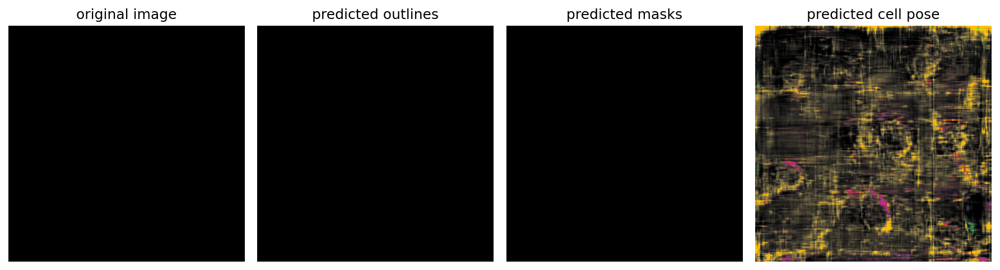

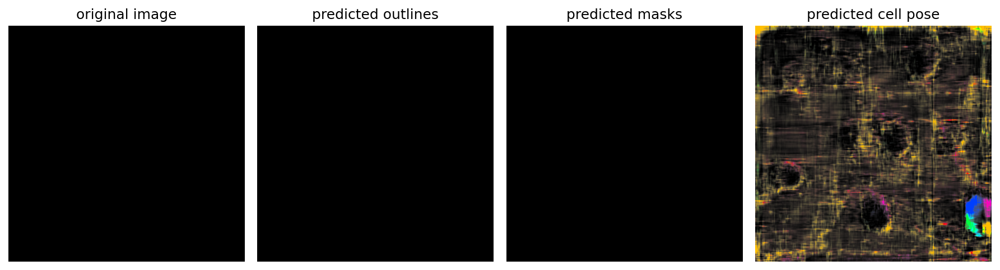

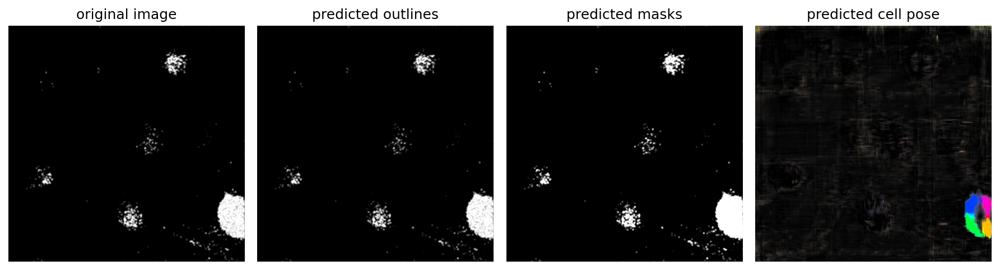

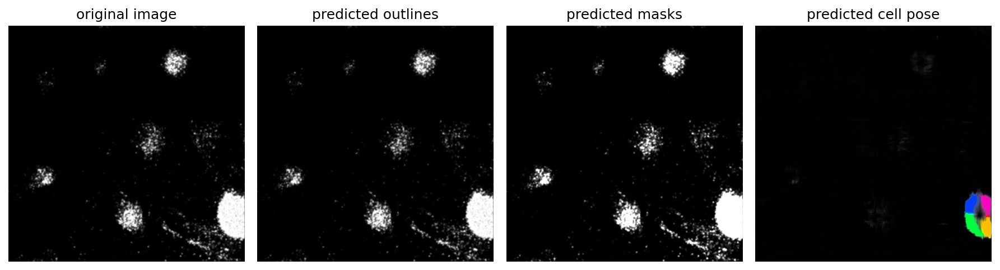

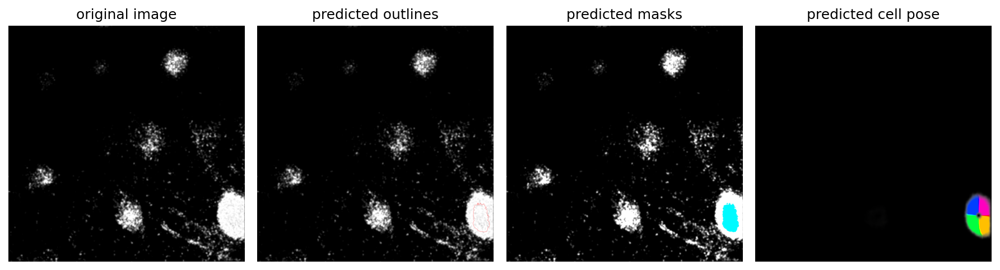

...

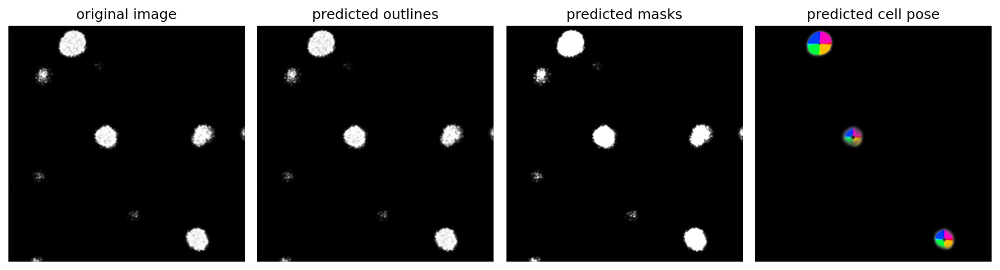

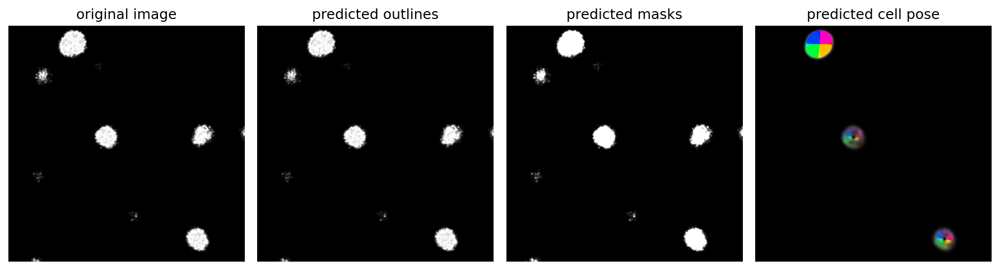

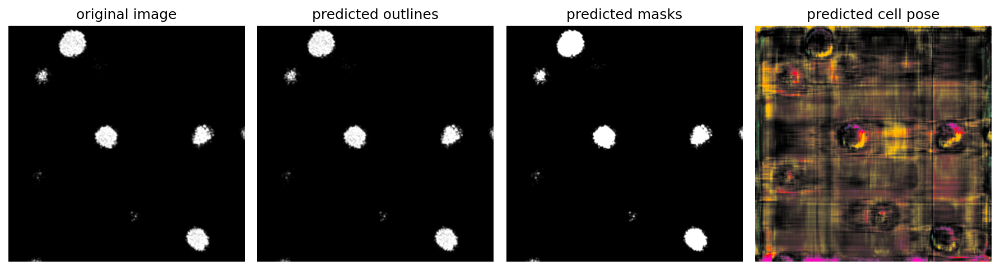

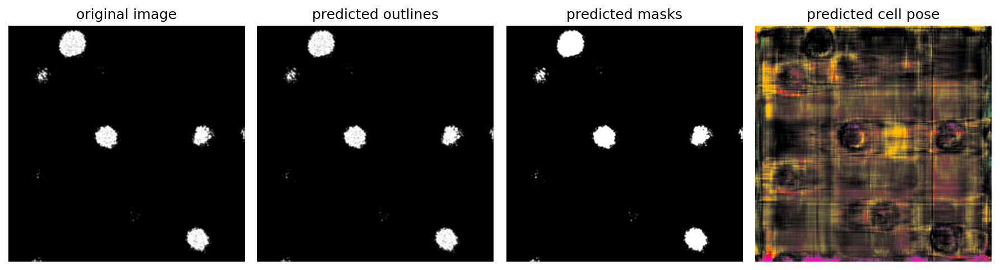

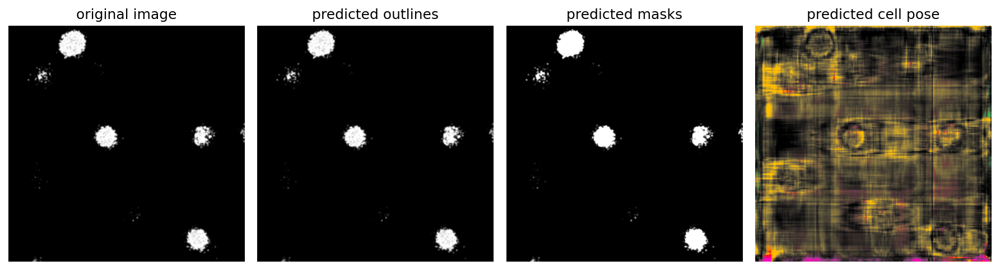

In [42]:
display_results(imgs_to_process, masks, flows[0])

## Remap mask ids
Remap mask ids to "compact" integers (from 0..len(unique_ids) range)

In [43]:
def compact_integer_values(a):
    uniqs = np.unique(a)
    max_value = uniqs.max()
    assert max_value < 100000, max_value # some reasonable threshold that assures we do not allocate unreasonable amounts of memory below
    compact_for_uniqs = np.zeros(uniqs.max()+1, dtype=np.int)
    compact_for_uniqs[uniqs] = range(len(uniqs)) # each uniq receives a new index from the range
    a_compact_values = compact_for_uniqs[a]
    return a_compact_values

In [44]:
masks = compact_integer_values(masks)

## Mask volume estimate through voxel counting

In [45]:
masks_orig = masks
masks = np.copy(masks_orig)

In [46]:
mask_indices, mask_volume = np.unique(masks,return_counts=True)
mask_indices, mask_volume = mask_indices[1:], mask_volume[1:] # zero is background so we drop it for volume analysis
mask_indices, mask_volume

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17]),
 array([  6195, 296205,   2772, 614373, 553046, 554329, 560646, 551552,
        687692,  35335, 119327, 619597, 569007, 107471,  24476, 532697,
        437501]))

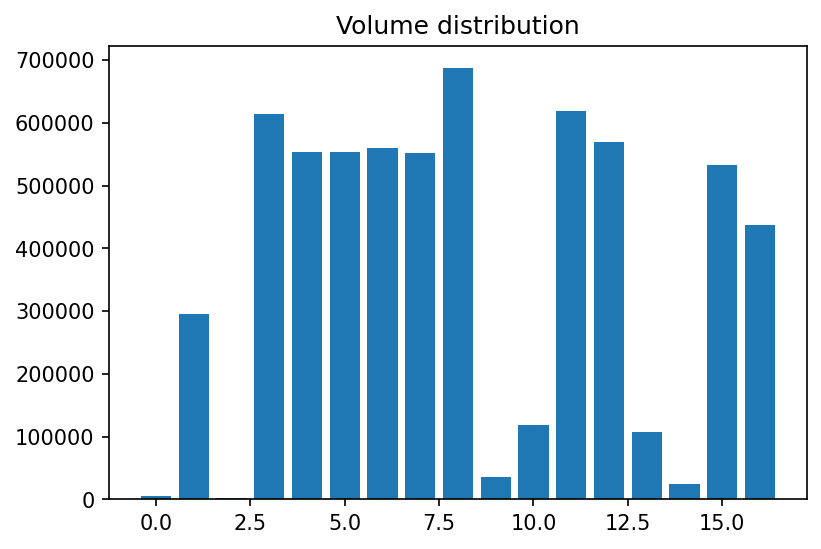

In [47]:
plt.bar(range(len(mask_volume)), mask_volume)
plt.title('Volume distribution')
plt.show()

In [48]:
mask_volume_threshold = mask_volume.max()*mask_volume_threshold_of_max
mask_volume_threshold

34384.6

In [49]:
np.sum(mask_volume > mask_volume_threshold)

14

In [50]:
masks_indices_above_threshold = mask_indices[mask_volume > mask_volume_threshold]

In [51]:
masks[np.isin(masks, masks_indices_above_threshold, invert=True)] = 0

In [52]:
np.unique(masks)

array([ 0,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17])

In [53]:
compact_integer_values(masks)

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [54]:
masks = masks_orig

Put the exploratory code from the above into a reusable function

In [55]:
from IPython.display import display
def zero_small_volume_masks(masks, mask_volume_threshold_of_max):
    mask_indices, mask_volume = np.unique(masks,return_counts=True)
    mask_indices, mask_volume = mask_indices[1:], mask_volume[1:] # zero is background so we drop it for volume analysis
    display(mask_indices, mask_volume)
    
    plt.bar(range(len(mask_volume)), mask_volume)
    plt.title('Volume distribution')
    plt.show()
    
    mask_volume_threshold = mask_volume.max()*mask_volume_threshold_of_max
    
    import pandas as pd
    df = pd.DataFrame(mask_volume, columns=['volume'])
    display(df)
    
    df['% of max'] = (df['volume'] / df['volume'].max() * 100).round(1)
    display(df)
    
    masks_indices_above_threshold = mask_indices[mask_volume > mask_volume_threshold]
    masks_large_only = np.copy(masks)
    masks_large_only[np.isin(masks_large_only, masks_indices_above_threshold, invert=True)] = 0
    
    masks_large_only = compact_integer_values(masks_large_only)
    
    display(np.unique(masks_large_only))
    
    return masks_large_only

### Remove small volume outliers

In [56]:
np.unique(masks)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17])

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])

array([  6195, 296205,   2772, 614373, 553046, 554329, 560646, 551552,
       687692,  35335, 119327, 619597, 569007, 107471,  24476, 532697,
       437501])

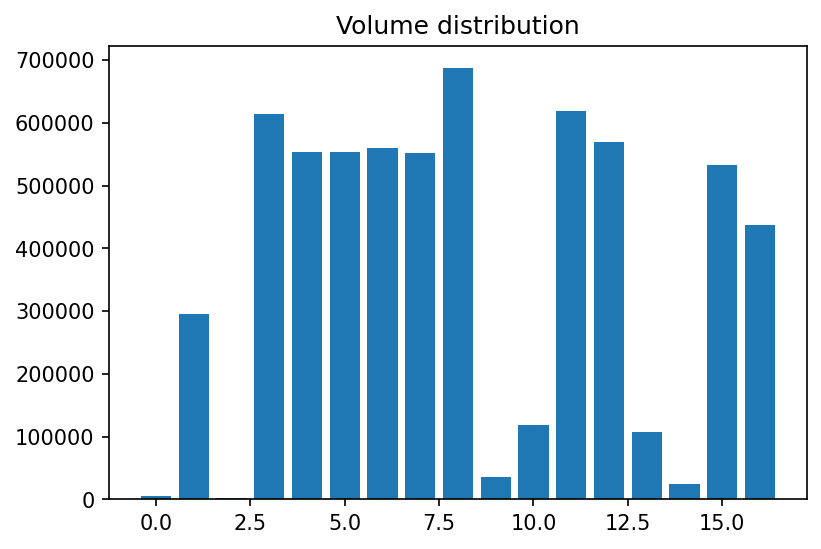

,volume
0,6195
1,296205
2,2772
3,614373
4,553046
5,554329
6,560646
7,551552
8,687692
9,35335


,volume,% of max
0,6195,0.9
1,296205,43.1
2,2772,0.4
3,614373,89.3
4,553046,80.4
5,554329,80.6
6,560646,81.5
7,551552,80.2
8,687692,100.0
9,35335,5.1


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [57]:
masks = zero_small_volume_masks(masks, mask_volume_threshold_of_max)

In [58]:
np.unique(masks)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

### Save final masks: compacted and without small volume outliers

In [59]:
np.save(f"{out_mask_filepath}", masks.astype(np.int8))